In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys, os
sys.path.append("../..")
sys.path.append("..")
sys.path.append(os.getcwd())
import re
import datetime

import math
import scipy

from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns
sns.set()
sns.set(palette="bright")
sns.set_style("whitegrid")

from sklearn import linear_model
from cycler import cycler
from celluloid import Camera
from IPython.display import HTML

import importlib
import warnings
import numpy as np
import pandas as pd
import copy
import random
from tslib.src import tsUtils
from tslib.tests import testdata
from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation, DBSCAN #For clustering
from sklearn.mixture import GaussianMixture #For GMM clustering
from filter_data import *
from load_and_clean import *
import hdbscan
import plotly.figure_factory as ff
%matplotlib inline
import json

In [3]:
from load_and_clean import *

#update_data()

us = load_clean('NYTimes US')
uscases, usdeaths, usstates = load_clean('NYTimes states')
uscounties_cases, uscounties_deaths, uscounties = load_clean('NYTimes counties')
global_cases, global_deaths = load_clean('JHU global')
us_covid_jhu_cases, us_covid_jhu_deaths = load_clean('JHU US')
mobility_data_apple, mobility_data_google, google_social = load_clean('mobility')
sd_data = load_clean('IHME intervention')
all_population, us_population, usstates_population, uscounties_population = load_clean('population')
temp_cluster = np.load('temp_cluster.npy',allow_pickle='TRUE').item()

uscases_pop_adjusted, usdeaths_pop_adjusted = create_population_adjusted_data(uscases, all_population), \
                                    create_population_adjusted_data(usdeaths, all_population, show_exception = True)
global_cases_pop_adjusted, global_deaths_pop_adjusted = create_population_adjusted_data(global_cases, all_population), \
                                    create_population_adjusted_data(global_deaths, all_population, show_exception = True)

uscounties_cases_pop_adjusted = create_population_adjusted_data(uscounties_cases, all_population, show_exception = True, county = True)
uscounties_deaths_pop_adjusted = create_population_adjusted_data(uscounties_deaths, all_population, county = True)

state_reopen = load_clean('state reopen')
#fips_df = pd.read_csv("../COVID/COVID-19/csse_covid_19_data/UID_ISO_FIPS_LookUp_Table.csv")

These countries/region do not have population data ['Virgin Islands']
These countries/region do not have population data ['Bahamas', 'Cabo Verde', 'Congo (Brazzaville)', 'Congo (Kinshasa)', "Cote d'Ivoire", 'Diamond Princess', 'Eswatini', 'Gambia', 'Holy See', 'Kyrgyzstan', 'North Macedonia', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Slovakia', 'Taiwan*', 'Syria', 'West Bank and Gaza', 'Saint Kitts and Nevis', 'Burma', 'MS Zaandam', 'Western Sahara']
These countries/region do not have population data ['Anchorage-Alaska', 'Joplin-Missouri', 'Kansas City-Missouri', 'Unknown-Alaska', 'Unknown-Arizona', 'Unknown-Arkansas', 'Unknown-California', 'Unknown-Colorado', 'Unknown-Connecticut', 'Unknown-Delaware', 'Unknown-Florida', 'Unknown-Georgia', 'Unknown-Guam', 'Unknown-Hawaii', 'Unknown-Idaho', 'Unknown-Illinois', 'Unknown-Indiana', 'Unknown-Iowa', 'Unknown-Kansas', 'Unknown-Kentucky', 'Unknown-Louisiana', 'Unknown-Maine', 'Unknown-Maryland', 'Unknown-Massachusetts', 'Unknown-Mich

In [10]:
positive_cases, negative_cases = load_clean('CTP states')

KeyError: 'CTP states'

In [4]:
#Filter data (this part might be overlapping some cells, but it should contain most of the varilables that are analyzed. )
# This part might be to split and explain
# This part might be to split and explain
t = 7
global_deaths_filtered = create_filtered_data(global_deaths, 500 )
#the last column of social distancing dataset is the last social distancing measure used by a location
educational_distancing = get_social_distancing(sd_data, sd_data.columns[-1])

all_data = pd.concat([global_deaths, usdeaths, uscounties_deaths], axis=1)  
all_data_daily = create_rolling_data(all_data, t)

all_data_cases = pd.concat([global_cases, uscases, uscounties_cases], axis=1) 
all_data_cases_daily = create_rolling_data(all_data_cases, t)

all_cases_data_pop = pd.concat([uscases_pop_adjusted,global_cases_pop_adjusted, uscounties_cases_pop_adjusted], axis = 1)
all_cases_data_pop_daily = create_rolling_data(all_cases_data_pop, t)

all_death_data_pop = pd.concat([usdeaths_pop_adjusted,global_deaths_pop_adjusted, uscounties_deaths_pop_adjusted], axis = 1)
all_death_data_pop_daily = create_rolling_data(all_death_data_pop, t)

_, daily_global, intervention_date_global = create_intervention_adjusted_data(global_deaths, educational_distancing, t)
_, daily_us, intervention_date_us = create_intervention_adjusted_data(usdeaths, educational_distancing, t)
_, daily_uscounties, intervention_date_uscounties = create_intervention_adjusted_data(uscounties_deaths, educational_distancing, t)

cases_intervention_adjusted, cases_intervention_adjusted_daily, intervention_date_case = create_intervention_adjusted_data(all_data_cases, educational_distancing, t)
deaths_intervention_adjusted, deaths_intervention_adjusted_daily, intervention_date_death = create_intervention_adjusted_data(all_data, educational_distancing, t)
#deaths_intervention_adjusted_google, deaths_intervention_adjusted_daily_google, _ = create_intervention_adjusted_data(all_data, google_social, t)

all_cases_data_pop_adjusted, all_cases_data_pop_adjusted_daily, _ = create_intervention_adjusted_data(all_cases_data_pop, educational_distancing, t)
all_death_data_pop_adjusted, all_death_data_pop_adjusted_daily, _ = create_intervention_adjusted_data(all_death_data_pop, educational_distancing, t)

last date
Exceptions are []


In [5]:
column = list(mobility_data_google.columns).index('retail_and_recreation_percent_change_from_baseline')
mobility_data_google['county_state'] = mobility_data_google['sub_region_2'] + '-' + mobility_data_google['sub_region_1']
us_mobility_county = mobility_data_google.loc[mobility_data_google.country_region == 
                                       "United States"].pivot_table(index='date', values=mobility_data_google.columns[column], columns='county_state')
us_mobility_state =  mobility_data_google.loc[mobility_data_google.country_region == 
                                       "United States"].pivot_table(index='date', values=mobility_data_google.columns[column], columns='sub_region_1')

In [6]:
us_mobility_county_daily = create_rolling_data(us_mobility_county, 7)
us_mobility_state_daily = create_rolling_data(us_mobility_state, 7)

In [8]:
df_sample = pd.read_csv('minoritymajority.csv') #use if the following line does not work
# df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv')
fips = df_sample[['FIPS', 'STNAME', 'CTYNAME']]

fips.columns = ['fips', 'state', 'county']

## Clustering after intervention - by state

### intervention adjusted for state

In [31]:
us_mobility_state_daily.index = pd.to_datetime(us_mobility_state_daily.index)
state_adjusted = pd.DataFrame()
for state in us_mobility_state:
    if (sd_data['name'] == state).any():
        intervention_date = pd.to_datetime(sd_data[sd_data['name'] == state]['last date'].values[0])
        new_col = pd.Series(us_mobility_state_daily[state]
                            [(us_mobility_state_daily[state].index > intervention_date)].values, 
                             name = state)
        

        state_adjusted = pd.concat([state_adjusted, new_col], axis = 1 )

### Clustering

In [32]:
feature_dict, features = cluster_time_series(state_adjusted.iloc[:30], cluster_method = 'kmeans', n_clusters = 5)                         

In [33]:
cluster_df = features['cluster'].reset_index()
cluster_df.columns = ['state', 'cluster']

fips.columns = ['fips', 'state', 'county']
cluster_df = pd.merge(cluster_df, fips, how = 'inner', on = 'state')

group = cluster_df['fips']
values = cluster_df['cluster']
fig = ff.create_choropleth(fips=group, values=values)
fig.layout.template = None
fig.show()

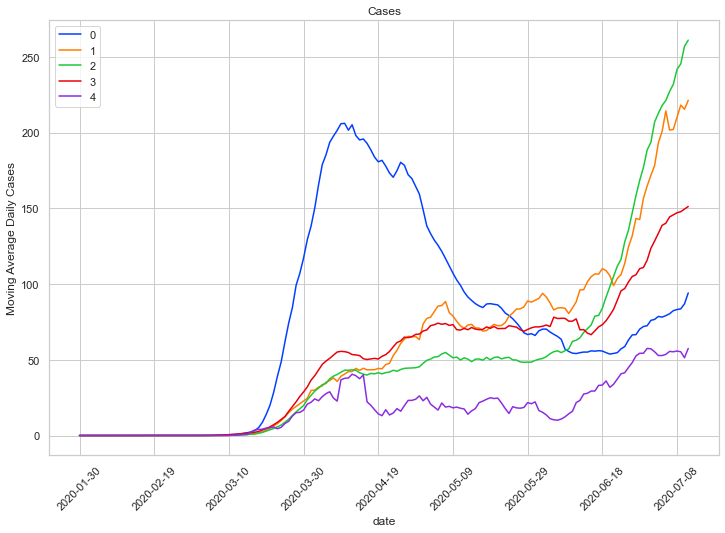

In [34]:


plt.rcParams['figure.figsize'] = (12, 8)
dfplot=all_data_cases_daily
i=0
for key in feature_dict:
    group = feature_dict[key]
    temp = []
    for county in group:
        if county in dfplot.columns:
            temp.append(county)
    (1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label = key)
    #(1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label=group_labels[i])
    plt.xticks(rotation=45), plt.ylabel('Moving Average Daily Cases'), plt.title('Cases'), plt.legend()
    i=i+1
plt.show()

In [36]:
state_adjusted

,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,1.764822,0.035714,1.120879,0.708094,0.04619,0.224490,0.821429,1.130952,1.000000,2.010204,...,3.069048,0.969733,2.059318,0.931973,3.428571,1.067946,0.005714,0.097403,1.314600,4.974206
1,2.758870,1.214286,1.120879,0.835471,0.04619,0.450000,0.821429,2.845238,1.142857,2.010204,...,3.069048,0.846099,2.059318,2.044218,3.428571,1.067946,0.005714,0.097403,1.314600,4.974206
2,2.715391,1.857143,1.120879,0.398496,0.00000,0.591180,0.875000,2.666667,0.857143,2.900728,...,3.069048,0.846099,2.059318,1.142857,3.428571,0.795882,0.005714,0.424784,0.903561,5.805556
3,1.931936,2.000000,1.120879,0.553008,0.00000,0.782313,0.321429,2.666667,0.857143,2.816327,...,2.997619,1.584384,2.874532,1.142857,1.785714,0.795882,0.005714,0.993661,0.903561,5.472222
4,2.009317,1.964286,0.989011,0.967293,0.00000,1.231293,0.321429,2.761905,1.285714,2.622449,...,2.200000,2.013361,2.540698,1.142857,1.785714,0.361358,0.000000,0.993661,1.967120,5.472222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,NaN,NaN,NaN,NaN,1.14677,NaN,3.615646,NaN,NaN,NaN,...,NaN,NaN,NaN,2.576792,NaN,NaN,NaN,NaN,NaN,3.698413
123,NaN,NaN,NaN,NaN,1.14677,NaN,3.346939,NaN,NaN,NaN,...,NaN,NaN,NaN,2.576792,NaN,NaN,NaN,NaN,NaN,NaN
124,NaN,NaN,NaN,NaN,NaN,NaN,3.346939,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125,NaN,NaN,NaN,NaN,NaN,NaN,3.346939,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


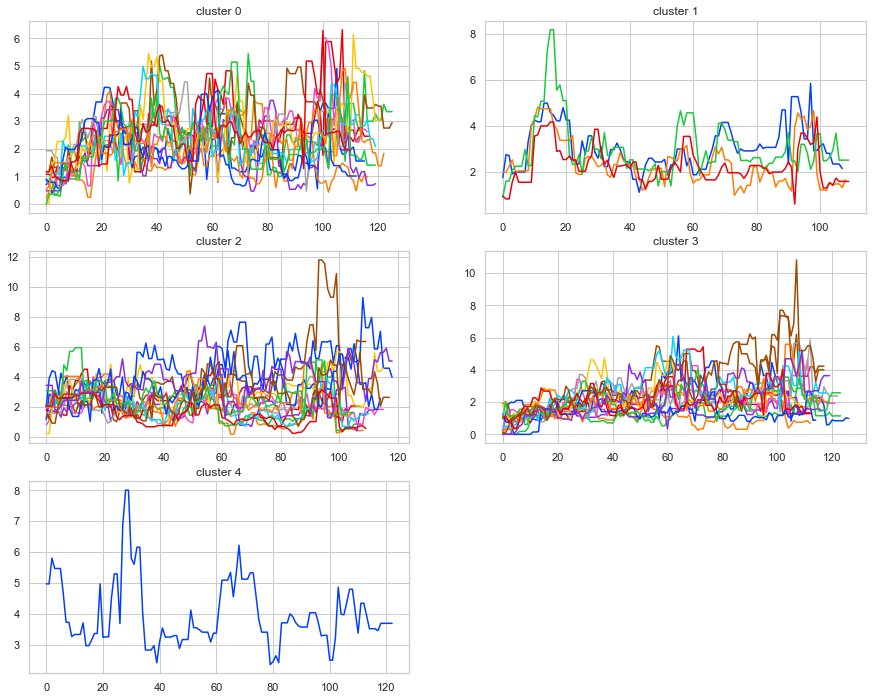

In [35]:
i = 321
for key in feature_dict:
    ax = plt.subplot(i)
    i += 1
    state_adjusted.iloc[:][feature_dict[key]].plot(ax = ax, legend=False, figsize = (15, 12), title = "cluster %s" %(key))

## Clustering after memorial day

In [27]:
post_memo = us_mobility_state.loc['2020-05-25':]
feature_dict, features = cluster_time_series(post_memo, cluster_method = 'kmeans', n_clusters = 4)

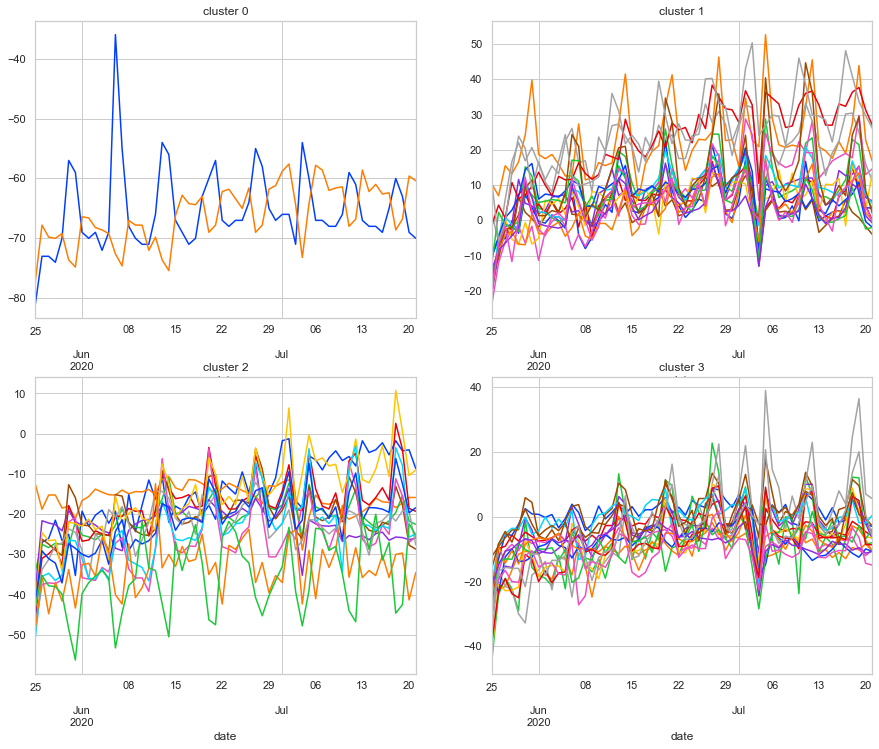

In [28]:
i = 221
for key in feature_dict:
    ax = plt.subplot(i)
    i += 1 
    post_memo[feature_dict[key]].plot(ax = ax, legend=False, figsize = (15, 12), title = "cluster %s" %(key))

In [14]:
cluster_df = features['cluster'].reset_index()
cluster_df.columns = ['state', 'cluster']

cluster_df = pd.merge(cluster_df, fips, how = 'inner', on = 'state')

group = cluster_df['fips']
values = cluster_df['cluster']
fig = ff.create_choropleth(fips=group, values=values)
fig.layout.template = None
fig.show()

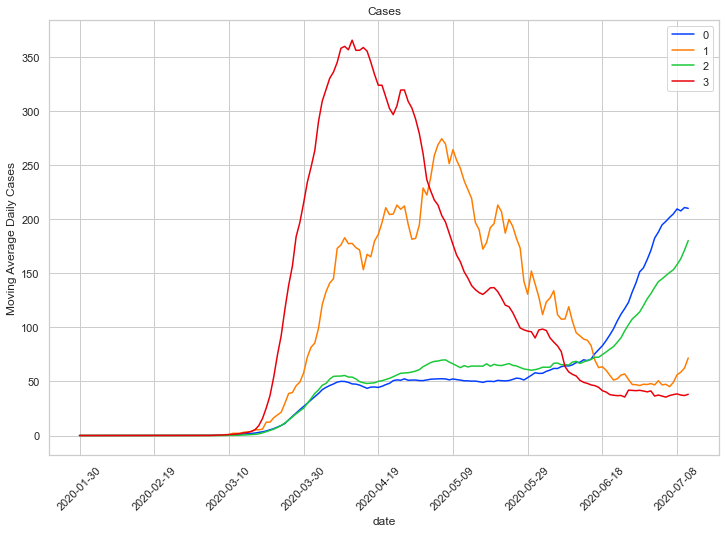

In [15]:
plt.rcParams['figure.figsize'] = (12, 8)
dfplot=all_data_cases_daily
i=0
for key in feature_dict:
    group = feature_dict[key]
    temp = []
    for county in group:
        if county in dfplot.columns:
            temp.append(county)
    (1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label = key)
    #(1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label=group_labels[i])
    plt.xticks(rotation=45), plt.ylabel('Moving Average Daily Cases'), plt.title('Cases'), plt.legend()
    i=i+1
plt.show()

### intervention adjusted for county

In [ ]:
#This is for intervention adjusted dataframe
us_mobility_county.index = pd.to_datetime(us_mobility_county.index)
county_adjusted = pd.DataFrame()
for county in us_mobility_county:
    state = county.split('-')[1]
    if (sd_data['name'] == state).any():
        intervention_date = pd.to_datetime(sd_data[sd_data['name'] == state]['last date'].values[0])
        new_col = pd.Series(us_mobility_county[county]
                            [(us_mobility_county[county].index > intervention_date)].values, 
                             name = county)
        

        county_adjusted = pd.concat([county_adjusted, new_col], axis = 1 )

In [ ]:
us_mobility_county = us_mobility_county.fillna(0)
post_memo = us_mobility_county.loc['2020-05-25':]
feature_dict, features = cluster_time_series(post_memo, cluster_method = 'kmeans', n_clusters = 4)

In [ ]:
i = 221
for key in feature_dict:
    ax = plt.subplot(i)
    i += 1
    post_memo[feature_dict[key]].plot(ax = ax, legend=False, figsize = (15, 12), title = "cluster %s" %(key))

In [ ]:
plt.rcParams['figure.figsize'] = (12, 8)
dfplot=all_data_cases_daily

for key in feature_dict:
    group = feature_dict[key]
    temp = []
    for county in group:
        if county in dfplot.columns:
            temp.append(county)
    (1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label = key)
    #(1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label=group_labels[i])
    plt.xticks(rotation=45), plt.ylabel('Moving Average Daily Cases'), plt.title('Cases'), plt.legend()
plt.show()

## Use Apple transit mobility

In [ ]:
us_transit_apple = mobility_data_apple[(mobility_data_apple['transportation_type'] == 'transit') & \
                    (mobility_data_apple['country'] == 'United States')]
us_transit_apple['county_state'] = us_transit_apple['region'] + '-' + us_transit_apple['sub-region']
us_transit_apple_county = us_transit_apple.iloc[:, 6:]
us_transit_apple_county = us_transit_apple_county.set_index('county_state').T
us_transit_apple_county = us_transit_apple_county.drop(columns = np.nan)
us_transit_apple_state = us_transit_apple.groupby('sub-region').sum().T

### cluster by county

In [ ]:
post_memo = us_transit_apple_county.loc['2020-05-25':]
feature_dict, features = cluster_time_series(post_memo, cluster_method = 'kmeans', n_clusters = 4)

In [ ]:
i = 221
for key in feature_dict:
    ax = plt.subplot(i)
    i += 1
    post_memo[feature_dict[key]].plot(ax = ax, legend=False, figsize = (15, 12), title = "cluster %s" %(key))

In [ ]:
plt.rcParams['figure.figsize'] = (12, 8)
dfplot=all_data_cases_daily

for key in feature_dict:
    group = feature_dict[key]
    temp = []
    for county in group:
        if county in dfplot.columns:
            temp.append(county)
    (1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label = key)
    #(1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label=group_labels[i])
    plt.xticks(rotation=45), plt.ylabel('Moving Average Daily Cases'), plt.title('Cases'), plt.legend()
plt.show()

### Clustering by state

In [ ]:
post_memo = us_transit_apple_state.loc['2020-05-25':]
feature_dict, features = cluster_time_series(post_memo, cluster_method = 'kmeans', n_clusters = 4)

In [ ]:
i = 221
for key in feature_dict:
    ax = plt.subplot(i)
    i += 1
    post_memo[feature_dict[key]].plot(ax = ax, legend=False, figsize = (15, 12), title = "cluster %s" %(key))

In [ ]:
plt.rcParams['figure.figsize'] = (12, 8)
dfplot=all_data_cases_daily

for key in feature_dict:
    group = feature_dict[key]
    temp = []
    for county in group:
        if county in dfplot.columns:
            temp.append(county)
    (1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label = key)
    #(1000000*dfplot[temp].sum(axis=1)/(all_population[all_population.index.isin(temp)].value.sum())).plot(label=group_labels[i])
    plt.xticks(rotation=45), plt.ylabel('Moving Average Daily Cases'), plt.title('Cases'), plt.legend()
plt.show()

In [ ]:
cluster_df = features['cluster'].reset_index()
cluster_df.columns = ['state', 'cluster']
cluster_df = pd.merge(cluster_df, fips, how = 'inner', on = 'state')

group = cluster_df['fips']
values = cluster_df['cluster']
fig = ff.create_choropleth(fips=group, values=values)
fig.layout.template = None
fig.show()